<a href="https://colab.research.google.com/github/johanhoffman/DD2365_VT21/blob/main/template-report-Navier-Stokes-ALE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The Navier-Stokes equations - ALE**
**Johan Hoffman**

**Lab made by Miguel De Le Court**

# **Abstract**

This short report solves the Navier-Stokes equations on a moving domain, using an ALE method. It also highlights the use of the elastic solid equatins to deform a mesh while preserving the general shape of the elements. This report was made as part of the course DD2365 Advanced Computation in Fluid Mechanics, at the KTH Royal Institute of Technology.

[DD2365 course website.](https://www.kth.se/social/course/DD2365/)

# **About the code**

In [1]:
"""This program is an example file for the course"""
"""DD2365 Advanced Computation in Fluid Mechanics, """
"""KTH Royal Institute of Technology, Stockholm, Sweden."""

# Copyright (C) 2021 Johan Hoffman (jhoffman@kth.se)

# This file is part of the course DD2365 Advanced Computation in Fluid Mechanics
# KTH Royal Institute of Technology, Stockholm, Sweden
#
# This is free software: you can redistribute it and/or modify
# it under the terms of the GNU Lesser General Public License v2.

# This template is maintained by Johan Hoffman
# Please report problems to jhoffman@kth.se

'KTH Royal Institute of Technology, Stockholm, Sweden.'

# **Set up environment**

In [2]:
# Load neccessary modules.
try:
    from google.colab import files #Unnecessary if ran locally
    ! sudo apt-get install texlive-latex-extra 
    ! sudo apt install texlive-fonts-recommended
    ! sudo apt install dvipng
    ! sudo apt-get install cm-super
except:
    pass

import numpy as np
import time

# Install FEniCS
try:
    import dolfin
except ImportError as e:
    !apt-get install -y -qq software-properties-common
    !add-apt-repository -y ppa:fenics-packages/fenics
    !apt-get update -qq
    !apt install -y --no-install-recommends fenics
    !sed -i "s|#if PETSC_VERSION_MAJOR == 3 && PETSC_VERSION_MINOR <= 8 && PETSC_VERSION_RELEASE == 1|#if 1|" /usr/include/dolfin/la/PETScLUSolver.h
    !rm -rf /usr/lib/python3/dist-packages/mpi4py*
    !rm -rf /usr/lib/python3/dist-packages/petsc4py*
    !rm -rf /usr/lib/python3/dist-packages/slepc4py*
    !rm -rf /usr/lib/petsc/lib/python3/dist-packages/dolfin*
    !rm -rf /usr/lib/petsc/lib/python3/dist-packages/mshr*
    !wget "https://drive.google.com/uc?export=download&id=1cT_QBJCOW_eL3BThnval3bcpb8o0w-Ad" -O /tmp/mpi4py-2.0.0-cp37-cp37m-linux_x86_64.whl
    !wget "https://drive.google.com/uc?export=download&id=119i49bxlGn1mrnhTNmOvM4BqmjrT9Ppr" -O /tmp/petsc4py-3.7.0-cp37-cp37m-linux_x86_64.whl
    !wget "https://drive.google.com/uc?export=download&id=1-1tVfu8qz3bRC2zvR8n3RESpesWqNnn6" -O /tmp/slepc4py-3.7.0-cp37-cp37m-linux_x86_64.whl
    !wget "https://drive.google.com/uc?export=download&id=1-3qY4VIJQaXVO1HfGQIzTIURIeJbvX-9" -O /tmp/fenics_dolfin-2019.2.0.dev0-cp37-cp37m-linux_x86_64.whl
    !wget "https://drive.google.com/uc?export=download&id=1-5SMjgjMuee_9WLeYtGe8N_lvipWEN7W" -O /tmp/mshr-2019.2.0.dev0-cp37-cp37m-linux_x86_64.whl
    !pip3 install /tmp/mpi4py-2.0.0-cp37-cp37m-linux_x86_64.whl --upgrade
    !pip3 install /tmp/petsc4py-3.7.0-cp37-cp37m-linux_x86_64.whl --upgrade
    !pip3 install /tmp/slepc4py-3.7.0-cp37-cp37m-linux_x86_64.whl --upgrade
    !pip3 install /tmp/fenics_dolfin-2019.2.0.dev0-cp37-cp37m-linux_x86_64.whl --upgrade
    !pip3 install /tmp/mshr-2019.2.0.dev0-cp37-cp37m-linux_x86_64.whl --upgrade
    !pip3 -q install --upgrade sympy
    import dolfin

from dolfin import *; from mshr import *

import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt

# **Introduction**

The Navier-Stokes equations take the form

$\dot u + (u\cdot \nabla)u + \nabla p -\Delta u = f,\quad \nabla \cdot u=0,$

together with suitable initial and boundary conditions.

Here we present a FEniCS implementation of a stabilized space-time Arbitrary Lagrangian-Eulerian (ALE) finite element method to solve the Navier-Stokes equations in 2D. The solution is visualized using FEniCS plotting functions, and is also exported as pvd-files which can be visualized in Paraview.

We seek a finite element approximation $(u,p)\in V\times Q$ such that 

$(\dot u + ((u-w)\cdot \nabla)u, v) - (p,\nabla \cdot v) + (\nu \nabla u,\nabla v) + (\nabla \cdot u, q) + SD(u,p;v,q) = (f,v),$

for all test functions $(v,q) \in \hat V\times \hat Q$, where $SD(u,p;v,q)$ is a residual based stabilization term. The mesh velocity is denoted by w. 

We present an example of flow past a circular cylinder, for which we compute the force on the surface of the cylinder $\Gamma$ in the direction $\phi$, by Green's formula: 

$
F(u,p,\phi)= ~<\nu \nabla u\cdot n-pn, \Phi>_{\Gamma} ~=~(\dot u+(u\cdot \nabla)u, \Phi) + (\nu \nabla u,\nabla \Phi) - (p,\nabla \cdot\Phi)-(f,\Phi),
$

with $\Phi\in V$ a fuinction for which $\Phi\vert _{\Gamma}=\phi$ and $\Phi\vert_{\partial \Omega \setminus \Gamma}=0$. With $\phi=(1,0)$ we get the drag force $F_D$, and with $\phi=(0,1)$ the lift force $F_L$. The drag and lift coefficients are obtained by normalization, 

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}
$

where $\rho$ is the density (here $\rho=1$), $U$ the characteristic velocity (here $U=1$), and $D$ the characteristic length scale (here $D$ is the diameter of the cylinder). 

The Reynolds number is defined as $Re=\frac{UD}{\nu}$

To read more about how to use similar methods for more complex problems, see e.g. 

[Hoffman, Johan, et al. "Towards a parameter-free method for high reynolds number turbulent flow simulation based on adaptive finite element approximation." Computer Methods in Applied Mechanics and Engineering 288 (2015): 60-74.](https://www.sciencedirect.com/science/article/pii/S0045782514004836)


# **Method**
For the sake of convenience, all the computations are handled by the function `simulate(mesh, Tmax, uinit=None, pinit=None, tinit=0.0, psi=None, meshdeform=None)` which follows the structure of the template. On all of the tests, we use $\nu = 4\times10^{-3}$. 

**Define domain and mesh**

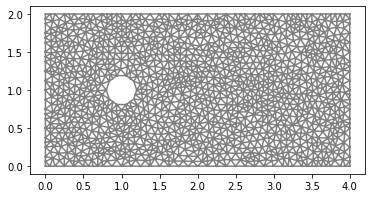

In [3]:
# Define rectangular domain 
L = 4
H = 2

# Define circle
xc = 1.0
yc = 0.5*H
rc = 0.2

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0) 

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)
      
left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh (examples with and without a hole in the mesh) 
resolution = 32
#mesh = RectangleMesh(Point(0.0, 0.0), Point(L, H), L*resolution, H*resolution)
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

# Local mesh refinement (specified by a cell marker)
no_levels = 0
for i in range(0,no_levels):
  cell_marker = MeshFunction("bool", mesh, mesh.topology().dim())
  for cell in cells(mesh):
    cell_marker[cell] = False
    p = cell.midpoint()
    if p.distance(Point(xc, yc)) < 1.0:
        cell_marker[cell] = True
  mesh = refine(mesh, cell_marker)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

plt.figure()
plot(mesh)
plt.show()

**Define finite element approximation spaces**

In [4]:
def simulate(mesh, Tmax, uinit=None, pinit=None, tinit=0.0, psi=None, meshdeform=None):
    # Generate finite element spaces (for velocity and pressure)
    V = VectorFunctionSpace(mesh, "Lagrange", 1)
    Q = FunctionSpace(mesh, "Lagrange", 1)

    # Define trial and test functions 
    u = TrialFunction(V)
    p = TrialFunction(Q)
    v = TestFunction(V)
    q = TestFunction(Q)

    # %% ====================================================================

    # Define boundary conditions 
    class DirichletBoundaryLower(SubDomain):
        def inside(self, x, on_boundary):
            return on_boundary and near(x[1], 0.0)

    class DirichletBoundaryUpper(SubDomain):
        def inside(self, x, on_boundary):
            return on_boundary and near(x[1], H)

    class DirichletBoundaryLeft(SubDomain):
        def inside(self, x, on_boundary):
            return on_boundary and near(x[0], 0.0) 

    class DirichletBoundaryRight(SubDomain):
        def inside(self, x, on_boundary):
            return on_boundary and near(x[0], L)

    class DirichletBoundaryObjects(SubDomain):
        def inside(self, x, on_boundary):
            return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

    dbc_lower = DirichletBoundaryLower()
    dbc_upper = DirichletBoundaryUpper()
    dbc_left = DirichletBoundaryLeft()
    dbc_right = DirichletBoundaryRight()
    dbc_objects = DirichletBoundaryObjects()

    # Examples of time dependent and stationary inflow conditions
    #uin = Expression('4.0*x[1]*(1-x[1])', element = V.sub(0).ufl_element())
    #uin = Expression('1.0 + 1.0*fabs(sin(t))', element = V.sub(0).ufl_element(), t=0.0)
    uin = 1.0
    bcu_in0 = DirichletBC(V.sub(0), uin, dbc_left)
    bcu_in1 = DirichletBC(V.sub(1), 0.0, dbc_left)
    bcu_upp0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
    bcu_upp1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
    bcu_low0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
    bcu_low1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
    bcu_obj0 = DirichletBC(V.sub(0), 0.0, dbc_objects)
    bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

    pin = Expression('5.0*fabs(sin(t))', element = Q.ufl_element(), t=0.0)
    pout = 0.0
    #bcp0 = DirichletBC(Q, pin, dbc_left) 
    bcp1 = DirichletBC(Q, pout, dbc_right)

    #bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
    bcu = [bcu_in0, bcu_in1, bcu_upp1, bcu_low1, bcu_obj0, bcu_obj1]
    bcp = [bcp1]

    # Define measure for boundary integration  
    ds = Measure('ds', domain=mesh, subdomain_data=boundaries)

    # %% ====================================================================

    nu = 4.0e-3

    # %% ====================================================================

    # Define iteration functions
    # (u0,p0) solution from previous time step
    # (u1,p1) linearized solution at present time step  
    u0 = Function(V)
    u1 = Function(V)
    p0 = Function(Q)
    p1 = Function(Q)
    t = 0.

    # Set parameters for nonlinear and lienar solvers 
    num_nnlin_iter = 5 
    prec = "amg" if has_krylov_solver_preconditioner("amg") else "default" 

    # Time step length 
    dt = 0.5*mesh.hmin()

    # Define mesh deformation w, mesh velocity = w/dt
    if meshdeform is None:
        w = Expression(("0.0", "0.0"), t=t, element = V.ufl_element())
    else:
        #w = Expression((
        #    "amp_x*sin(2.0*pi*t*freq)*sin(pi*x[0]/L) - amp_x*sin(2.0*pi*(t-dt)*freq)*sin(pi*x[0]/L)",
        #    "amp_y*sin(2.0*pi*t*freq-0.5*pi)*sin(pi*x[1]/H) - amp_y*sin(2.0*pi*(t-dt)*freq-0.5*pi)*sin(pi*x[1]/H)"), L=L, H=H, t=t, dt=dt, amp_x=amp_x, amp_y=amp_y, freq=freq, element = V.ufl_element()) #make the displacement independant from dt

        [E, kwargs] = meshdeform
        w = Expression(E, t=t, dt=dt, **kwargs, element = V.ufl_element())

    # %% ====================================================================

    # Define variational problem

    # Stabilization parameters
    h = CellDiameter(mesh);
    u_mag = sqrt(dot(u1,u1))
    d1 = 1.0/sqrt((pow(1.0/dt,2.0) + pow(u_mag/h,2.0)))
    d2 = h*u_mag

    # Mean velocities for trapozoidal time stepping
    um = 0.5*(u + u0)
    um1 = 0.5*(u1 + u0)

    # Momentum variational equation on residual form
    Fu = inner((u - u0)/dt + grad(um)*(um1-w/dt), v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
        + d1*inner((u - u0)/dt + grad(um)*(um1-w/dt) + grad(p1), grad(v)*(um1-w/dt))*dx + d2*div(um)*div(v)*dx 
    au = lhs(Fu)
    Lu = rhs(Fu)

    # Continuity variational equation on residual form
    Fp = d1*inner((u1 - u0)/dt + grad(um1)*(um1-w/dt) + grad(p), grad(q))*dx + div(um1)*q*dx 
    ap = lhs(Fp)
    Lp = rhs(Fp)

    # %% ====================================================================
    if psi is None:
        # Define the direction of the force to be computed in y
        psi_y_expression = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=0.0, phi_y=1.0, element = V.ufl_element())
        psi_y = interpolate(psi_y_expression, V)

        # Define the direction of the force to be computed in x
        psi_x_expression = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=1.0, phi_y=0.0, element = V.ufl_element())
        psi_x = interpolate(psi_x_expression, V)
    else:
        psi_x, psi_y = psi
    Forcey = inner((u1 - u0)/dt + grad(um1)*um1, psi_y)*dx - p1*div(psi_y)*dx + nu*inner(grad(um1), grad(psi_y))*dx
    Forcex = inner((u1 - u0)/dt + grad(um1)*um1, psi_x)*dx - p1*div(psi_x)*dx + nu*inner(grad(um1), grad(psi_x))*dx


    #plt.figure()
    #plot(psi, title="weight function psi")

    # Force normalization
    D = 2*rc
    normalization = -2.0/D

    # %% ====================================================================

    # Force computation data 
    force_x_array = np.array(0.0)
    force_x_array = np.delete(force_x_array, 0)
    force_y_array = np.array(0.0)
    force_y_array = np.delete(force_y_array, 0)
    time = np.array(0.0)
    time = np.delete(time, 0)

    print("Computing:")
    print("[%-40s] %2.0f%s" % ("", 0, "%"), end="")

    # %% ====================================================================


    # Time stepping 
    if uinit is not None:
        u0.assign(uinit)
        u1.assign(uinit)
    if pinit is not None:
        p0.assign(pinit)
        p1.assign(pinit)

    T = Tmax + tinit
    t = dt + tinit


    while t < T + DOLFIN_EPS:

        #s = 'Time t = ' + repr(t) 
        #print(s)

        pin.t = t
        #uin.t = t

        w.t = t
        ALE.move(mesh, w)

        # Solve non-linear problem 
        k = 0
        while k < num_nnlin_iter: 
            
            # Assemble momentum matrix and vector 
            Au = assemble(au)
            bu = assemble(Lu)

            # Compute velocity solution 
            [bc.apply(Au, bu) for bc in bcu]
            [bc.apply(u1.vector()) for bc in bcu]
            solve(Au, u1.vector(), bu, "bicgstab", "default")

            # Assemble continuity matrix and vector
            Ap = assemble(ap) 
            bp = assemble(Lp)

            # Compute pressure solution 
            [bc.apply(Ap, bp) for bc in bcp]
            [bc.apply(p1.vector()) for bc in bcp]
            solve(Ap, p1.vector(), bp, "bicgstab", prec)
            k += 1

        # Compute force
        Fx = assemble(Forcex)
        Fy = assemble(Forcey)
        force_x_array = np.append(force_x_array, normalization*Fx)
        force_y_array = np.append(force_y_array, normalization*Fy)
        time = np.append(time, t)

        # Update time step
        print("\r[%-40s] %2.0f%s" % ("="*int(np.ceil(40*(t-tinit)/Tmax)), 100*(t-tinit)/Tmax, "%"), end="")
        u0.assign(u1)
        t += dt

    print("\r[%-40s] %2.0f%s" % ("="*40, 100, "%"))
    drag = force_x_array
    lift = force_y_array
    return u1, p1, time, drag, lift, dt, [psi_x, psi_y]


# **Results**
We first look at the drag and lift as functions of time when the mesh is deformed an the hole moves.

Computing:
[========================================] 100%
Computing:
[========================================] 100%
Computing:
[========================================] 100%
Computing:
[========================================] 100%


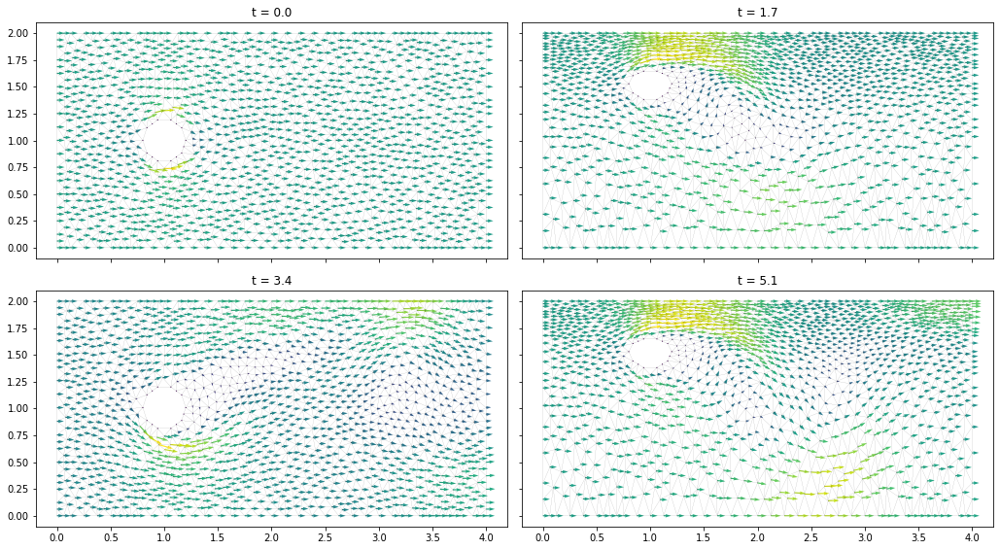

In [5]:
E = ("amp_x*sin(2.0*pi*t*freq)*sin(pi*x[0]/L) - amp_x*sin(2.0*pi*(t-dt)*freq)*sin(pi*x[0]/L)",
     "amp_y*sin(2.0*pi*t*freq-0.5*pi)*sin(pi*x[1]/H) - amp_y*sin(2.0*pi*(t-dt)*freq-0.5*pi)*sin(pi*x[1]/H)")
amp_x = 0.0; amp_y = 0.3; freq = 0.3
kwargs = {"L" : L, "H" : H, "amp_x" :amp_x, "amp_y":amp_y, "freq":freq}
deform = [E, kwargs]
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

u1, p1, time, drag, lift, dt, psi = simulate(mesh, Tmax=0.05, meshdeform=deform)

fsize = 2
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(1.8*fsize*L, 2*fsize*H))
axes = axes.ravel()
plt.sca(axes[0])
plot(mesh, linewidth=0.1, color="k", alpha=0.7)
plot(u1)
plt.title("t = %.1f" % time[-1])

for i in range(1,4):
    u1, p1, time0, drag0, lift0, dt, psi = simulate(mesh, uinit=u1, pinit=p1, tinit=time[-1], Tmax=1.7, psi=psi, meshdeform=deform)
    time = np.append(time, time0)
    drag = np.append(drag, drag0)
    lift = np.append(lift, lift0)

    plt.sca(axes[i])
    plot(mesh, linewidth=0.1, color="k", alpha=0.7)
    plot(u1)
    plt.title("t = %.1f" % time[-1])

plt.tight_layout()
plt.show()



Different instants of the simulation can be seen above, showing the periodic deformation of the mesh. Looking at the forces acting on the circle, we see this periodic behaviour in the lift. This is expected, as the holes moves up and down in the channel. The drag however doesn't seem to be affected too much by the movements and deformation of the mesh. The apparent discontinuties in the drag and lift forces below are simply a consequence of the simulation being stopped and restarted later.

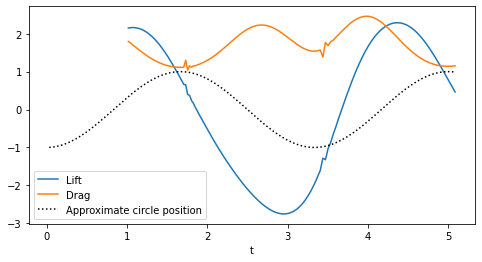

In [6]:
plt.figure(figsize=(fsize*L, fsize*H))
plt.plot(time[time>1], lift[time>1], label="Lift")
plt.plot(time[time>1], drag[time>1], label="Drag")
plt.plot(time, np.sin(2.0*np.pi*time*freq-0.5*np.pi), ":k", label="Approximate circle position")
plt.xlabel("t")
plt.legend()
plt.show()

We now look at a case where the mesh is deformed in such a way that the hole stays in place but gets deformed. 

Computing:
[========================================] 100%
Computing:
[========================================] 100%
Computing:
[                                        ]  0%Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
[========================================] 100%
Computing:
[                                        ]  0%Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
[========================================] 100%


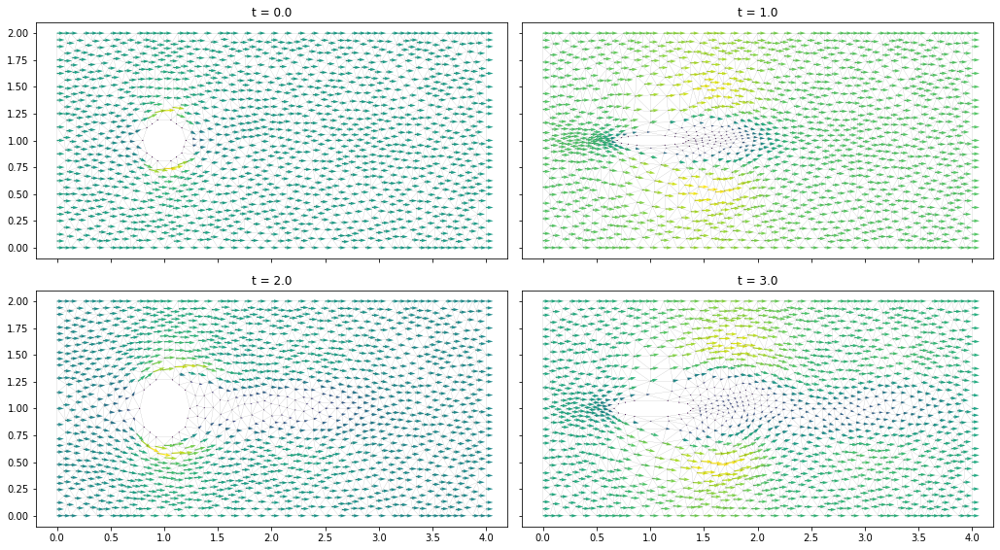

In [22]:
E = ("(x[0]-xc)/w/cosh((x[0]-xc)/w)*(x[0]*(1-x[0]/L))*(sin(2.0*pi*t*freq)+1e-1)*amp_x*x[1]/H*(1-x[1]/H)*dt*freq",
     "-(x[1]-yc)/w/cosh((x[1]-yc)/w)*(x[1]*(1-x[1]/H))*(sin(2.0*pi*t*freq)-1e-1)*amp_y*exp(-(x[0]-xc)*(x[0]-xc))*dt*freq")
amp_x = 3; amp_y = 3; freq = 0.5; w = 1/4
kwargs = {"L" : L, "H" : H, "w":w, "xc" : xc, "yc" : yc, "amp_x" :amp_x, "amp_y":amp_y, "freq":freq}
deform = [E, kwargs]
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

u1, p1, time, drag, lift, dt, psi = simulate(mesh, Tmax=0.05, meshdeform=deform)

fsize = 2
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(1.8*fsize*L, 2*fsize*H))
axes = axes.ravel()
plt.sca(axes[0])
plot(mesh, linewidth=0.1, color="k", alpha=0.7)
plot(u1)
plt.title("t = %.1f" % time[-1])

for i in range(1,4):
    u1, p1, time0, drag0, lift0, dt, psi = simulate(mesh, uinit=u1, pinit=p1, tinit=time[-1], Tmax=1.0, psi=psi, meshdeform=deform)
    time = np.append(time, time0)
    drag = np.append(drag, drag0)
    lift = np.append(lift, lift0)

    plt.sca(axes[i])
    plot(mesh, linewidth=0.1, color="k", alpha=0.7)
    plot(u1)
    plt.title("t = %.1f" % time[-1])

plt.tight_layout()
plt.show()

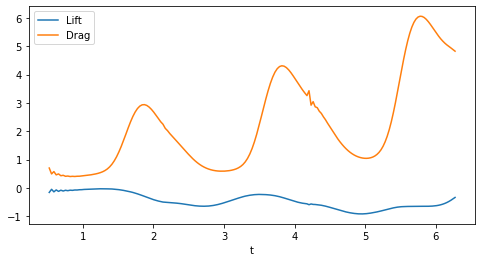

In [8]:
plt.figure(figsize=(fsize*L, fsize*H))
plt.plot(time[time>0.5], lift[time>0.5], label="Lift")
plt.plot(time[time>0.5], drag[time>0.5], label="Drag")
plt.xlabel("t")
plt.legend()
plt.show()

Here, unlike in the previous case, it is the drag that is mostly affected by the mesh deformation. This is again expected as we whange the width of the cylinder, thus increasing or reducung its cross-section. The lift, however is roughly at zero and fluctuates due to the vortecies of the flow, not due to a real lift.

# **Discussion**
A stabilized finite element method was implemented in FEniCS to solve the Navier-Stokes equations in 2D using an ALE finite element method. We observed as expected that drag and lift forces changed with the movement and deformation of the mesh. The drag force was moslty sensitice to the cross-section of the hole in the domain, while the lift relied on asymmetry to manifest itself.

# **Elasticity**
We now look at the elasticity model applied to the meshes.

# **Introduction**
The Elasticity equations take the form

$$ -\nabla \cdot \sigma = f$$

together with suitable boundary conditions.

To derive the weak form of the equations, multiply the equation by $v\in V$, and then integrate over the domain $\Omega$ and use Green's formula
$$
(-\nabla \cdot \sigma ,v) = (\nabla \sigma , \nabla v) - <\sigma \cdot n, v>_{\Gamma}
$$

To model 

We seek a finite element approximation $u\in V$ such that 

$$(\nabla \sigma,\nabla v) - <\sigma \cdot n, v>_{\partial \Omega} = (f,v)$$

for all test functions $v \in V$. 



# **Method**
For this part we use first-order basis functions. The boundary conditions are all Dirichlet boundary conditions that constraint the displacement of the mesh.

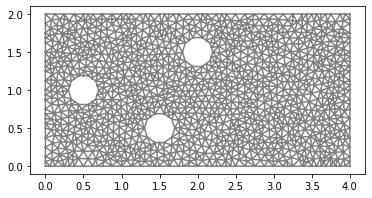

In [9]:
# Define rectangular domain 
L = 4.0
H = 2.0

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0) 

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)
      
left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh (examples with and without a hole in the mesh) 
resolution = 32
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(1.5,0.25*H),0.2) - Circle(Point(0.5,0.5*H),0.2) - Circle(Point(2.0,0.75*H),0.2), resolution)

# Local mesh refinement (specified by a cell marker)
no_levels = 0
for i in range(0,no_levels):
  cell_marker = MeshFunction("bool", mesh, mesh.topology().dim())
  for cell in cells(mesh):
    cell_marker[cell] = False
    p = cell.midpoint()
    if p.distance(Point(1.5, 0.5)) < 1.0:
        cell_marker[cell] = True
  mesh = refine(mesh, cell_marker)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

plt.figure()
plot(mesh)
plt.show()

In [10]:
# Generate finite element space
VE = VectorElement("CG", mesh.ufl_cell(), 1)

V = FunctionSpace(mesh, VE)

# Define trial and test functions
u = TrialFunction(V)
v = TestFunction(V) 

d = Function(V)

# Define boundary conditions 
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0) 

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], L)

class DirichletBoundaryObjects(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_right = DirichletBoundaryRight()
dbc_objects = DirichletBoundaryObjects()

bcu_left0 = DirichletBC(V.sub(0), 0.0, dbc_left)
bcu_left1 = DirichletBC(V.sub(1), 0.0, dbc_left)
bcu_right0 = DirichletBC(V.sub(0), 0.0, dbc_right)
bcu_right1 = DirichletBC(V.sub(1), 0.0, dbc_right)
bcu_upper0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
bcu_upper1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
bcu_lower0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
bcu_lower1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
bcu_obj0 = DirichletBC(V.sub(0), 0.5, dbc_objects)
bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

#bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
bcu = [bcu_left0, bcu_left1, bcu_right0, bcu_right1, bcu_upper1, bcu_lower1, bcu_obj0, bcu_obj1]

# **Results**

In [11]:
f = Expression(("0.0","0.0"), element = V.ufl_element())

dim = u.geometric_dimension()
E = 1.0e10
nu = 0.3
mu = E*0.5/(1+nu)
lambda_ = nu*E/((1.0+nu)*(1.0-2.0*nu))

def epsilon(u):
    return 0.5*(grad(u) + grad(u).T)

def sigma(u):
    #return 2.0*mu*epsilon(u)
    return lambda_*div(u)*Identity(dim) + 2.0*mu*epsilon(u)

# Define variational problem on residual form: r(u,v) = 0
residual = ( inner(sigma(u), epsilon(v))*dx - inner(f, v)*dx )

au = lhs(residual)
Lu = rhs(residual)

A = assemble(au)
b = assemble(Lu)

[bc.apply(A, b) for bc in bcu]
[bc.apply(d.vector()) for bc in bcu]

solve(A, d.vector(), b, "bicgstab", "default")

22

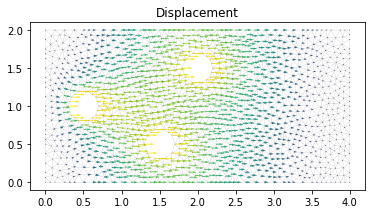

In [12]:
u1 = project(d, V)

# Plot solution
plt.figure()
plot(mesh, linewidth=0.1, color="k", alpha=0.7)
plot(u1, title="Displacement")

plt.show()

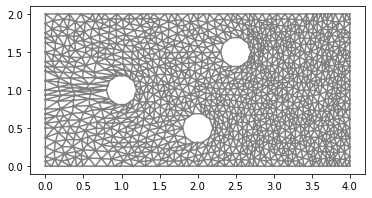

In [13]:
ALE.move(mesh, d)
plt.figure()
plot(mesh)
plt.show()


The baseline results above were computed with a Young's modulus of $10^{10}$ and a Poisson's ratio of $0.3$. Regarding the change in the mesh, it is a we expect it, the mesh smoothly transforms to fit the new boundaries. The choice of the parameters (Young's modulus and Poisson's ratio) hardly have any visible effect on the displacement of the mesh. As an example, the following figures are computed with a Poisson's ratio of $-0.9$ and a Young's modulus of $17$.

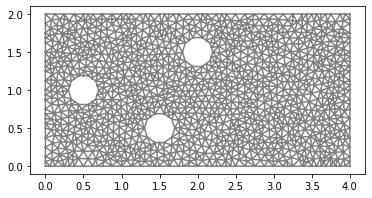

In [14]:
# Define rectangular domain 
L = 4.0
H = 2.0

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0) 

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)
      
left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh (examples with and without a hole in the mesh) 
resolution = 32
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(1.5,0.25*H),0.2) - Circle(Point(0.5,0.5*H),0.2) - Circle(Point(2.0,0.75*H),0.2), resolution)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

plt.figure()
plot(mesh)
plt.show()

In [15]:
# Generate finite element space
VE = VectorElement("CG", mesh.ufl_cell(), 1)

V = FunctionSpace(mesh, VE)

# Define trial and test functions
u = TrialFunction(V)
v = TestFunction(V) 

d = Function(V)

# Define boundary conditions 
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0) 

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], L)

class DirichletBoundaryObjects(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_right = DirichletBoundaryRight()
dbc_objects = DirichletBoundaryObjects()

bcu_left0 = DirichletBC(V.sub(0), 0.0, dbc_left)
bcu_left1 = DirichletBC(V.sub(1), 0.0, dbc_left)
bcu_right0 = DirichletBC(V.sub(0), 0.0, dbc_right)
bcu_right1 = DirichletBC(V.sub(1), 0.0, dbc_right)
bcu_upper0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
bcu_upper1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
bcu_lower0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
bcu_lower1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
bcu_obj0 = DirichletBC(V.sub(0), 0.5, dbc_objects)
bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

#bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
bcu = [bcu_left0, bcu_left1, bcu_right0, bcu_right1, bcu_upper1, bcu_lower1, bcu_obj0, bcu_obj1]

In [16]:
f = Expression(("0.0","0.0"), element = V.ufl_element())

dim = u.geometric_dimension()
E = 17
nu = -0.9
mu = E*0.5/(1+nu)
lambda_ = nu*E/((1.0+nu)*(1.0-2.0*nu))

def epsilon(u):
    return 0.5*(grad(u) + grad(u).T)

def sigma(u):
    #return 2.0*mu*epsilon(u)
    return lambda_*div(u)*Identity(dim) + 2.0*mu*epsilon(u)

# Define variational problem on residual form: r(u,v) = 0
residual = ( inner(sigma(u), epsilon(v))*dx - inner(f, v)*dx )

au = lhs(residual)
Lu = rhs(residual)

A = assemble(au)
b = assemble(Lu)

[bc.apply(A, b) for bc in bcu]
[bc.apply(d.vector()) for bc in bcu]

solve(A, d.vector(), b, "bicgstab", "default")

20

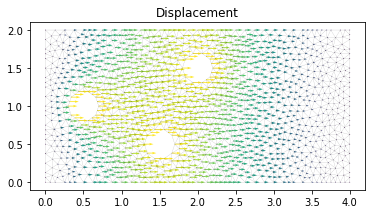

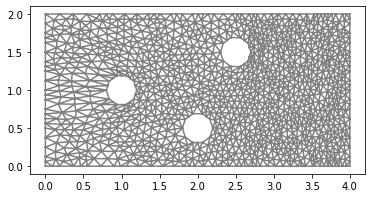

In [17]:
u1 = project(d, V)

# Plot solution
plt.figure()
plot(mesh, linewidth=0.1, color="k", alpha=0.7)
plot(u1, title="Displacement")
plt.show()

ALE.move(mesh, d)
plt.figure()
plot(mesh)
plt.show()

And while arguably different, this mesh is not fundamentally different from the previous one. We now port our interest to changes in the displacement. 

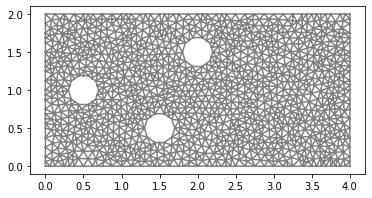

In [18]:
# Define rectangular domain 
L = 4.0
H = 2.0

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0) 

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)
      
left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh (examples with and without a hole in the mesh) 
resolution = 32
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(1.5,0.25*H),0.2) - Circle(Point(0.5,0.5*H),0.2) - Circle(Point(2.0,0.75*H),0.2), resolution)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

plt.figure()
plot(mesh)
plt.show()

In [19]:
# Generate finite element space
VE = VectorElement("CG", mesh.ufl_cell(), 1)

V = FunctionSpace(mesh, VE)

# Define trial and test functions
u = TrialFunction(V)
v = TestFunction(V) 

d = Function(V)

# Define boundary conditions 
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0) 

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], L)

class DirichletBoundaryObjects(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_right = DirichletBoundaryRight()
dbc_objects = DirichletBoundaryObjects()

dispx = Expression('x[1]*(1-x[1])/3', element = V.sub(0).ufl_element())
dispy = Expression('x[0]/10', element = V.sub(0).ufl_element())
bcu_left0 = DirichletBC(V.sub(0), 0.0, dbc_left)
bcu_left1 = DirichletBC(V.sub(1), 0.0, dbc_left)
bcu_right0 = DirichletBC(V.sub(0), 0.0, dbc_right)
bcu_right1 = DirichletBC(V.sub(1), 0.0, dbc_right)
bcu_upper0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
bcu_upper1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
bcu_lower0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
bcu_lower1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
bcu_obj0 = DirichletBC(V.sub(0), dispx, dbc_objects)
bcu_obj1 = DirichletBC(V.sub(1), dispy, dbc_objects)

#bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
bcu = [bcu_left0, bcu_left1, bcu_right0, bcu_right1, bcu_upper1, bcu_lower1, bcu_obj0, bcu_obj1]

In [20]:
f = Expression(("0.0","0.0"), element = V.ufl_element())

dim = u.geometric_dimension()
E = 1e10
nu = 0.3
mu = E*0.5/(1+nu)
lambda_ = nu*E/((1.0+nu)*(1.0-2.0*nu))

def epsilon(u):
    return 0.5*(grad(u) + grad(u).T)

def sigma(u):
    #return 2.0*mu*epsilon(u)
    return lambda_*div(u)*Identity(dim) + 2.0*mu*epsilon(u)

# Define variational problem on residual form: r(u,v) = 0
residual = ( inner(sigma(u), epsilon(v))*dx - inner(f, v)*dx )

au = lhs(residual)
Lu = rhs(residual)

A = assemble(au)
b = assemble(Lu)

[bc.apply(A, b) for bc in bcu]
[bc.apply(d.vector()) for bc in bcu]

solve(A, d.vector(), b, "bicgstab", "default")

19

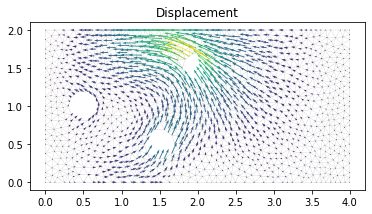

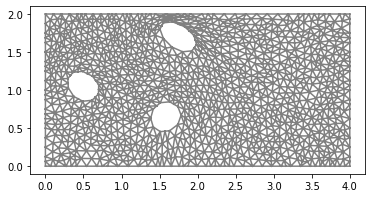

In [21]:
u1 = project(d, V)

# Plot solution
plt.figure()
plot(mesh, linewidth=0.1, color="k", alpha=0.7)
plot(u1, title="Displacement")
plt.show()

ALE.move(mesh, d)
plt.figure()
plot(mesh)
plt.show()

Since the choice of the elasticity parameters don't really matter, the only thing left is teh displacement itself. We can see above that the resulting displacement is as expected highly dependant on the boundary conditions.

# **Discussion**
We see that the elastic solid does wor as a way to deform a mesh while preserving its overrall shape as best as possible. The choice of the parameters dont really latter, meaning which lets a large flexibility and doesn't create problems of stability and consistency.